<a href="https://colab.research.google.com/github/DavidSalmon13/Database-Systems/blob/main/HW4/Problem1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# David Schwartzman
# 10/30/2024
# In this program, I will build a GAN model.
# Using a dataset of bedroom images, the GAN will be trained to generate new images that closely resemble the originals.

In [ ]:
import os
import random
import shutil
import glob
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import PIL.Image
import matplotlib.pyplot as plt
import PIL
from PIL import Image
# Constants
IMAGE_SIZE = 64
BATCH_SIZE = 128
EPOCHS = 400
BUFFER_SIZE = 5000
NOISE_DIM = 100

In [ ]:

from google.colab import drive

# Set Parameters
full_dataset_path = '/content/lsun_bedroom'
subset_dataset_path = '/content/lsun_bedroom_subset/bedroom'
num_images_to_select = 20000


# Step 1: Setup Kaggle to download the LSUN dataset
drive.mount('/content/drive')

# Copy kaggle.json to the appropriate location
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json  # Set permissions

# Install Kaggle
!pip install kaggle

# Download the LSUN Bedrooms dataset
dataset_zip_path = 'lsun_bedroom.zip'
print("Downloading the dataset...")
!kaggle datasets download -d jhoward/lsun_bedroom

# Unzip the dataset
if os.path.exists(dataset_zip_path):
    print("Extracting the dataset...")
    !unzip -o lsun_bedroom.zip -d /content/lsun_bedroom  # Use -o to overwrite without asking

if os.path.exists(subset_dataset_path):
    shutil.rmtree(subset_dataset_path)
os.makedirs(subset_dataset_path)

# List all image files in the full dataset directory
all_images = []
for root, dirs, files in os.walk(full_dataset_path):
    for file in files:
        if file.endswith(('.jpg', '.jpeg', '.png')):
            all_images.append(os.path.join(root, file))

# Randomly select a subset of images
subset_images = random.sample(all_images, min(num_images_to_select, len(all_images)))

# Copy the selected images into the subset directory
for image in subset_images:
    try:
        shutil.copy(image, subset_dataset_path)
    except Exception as e:
        print(f"Error copying {image}: {e}")

# Function to load images
def load_images(image_dir):
    images = []
    for image_path in glob.glob(os.path.join(image_dir, '*.jpg')) + \
                   glob.glob(os.path.join(image_dir, '*.png')):
        try:
            img = Image.open(image_path).convert("RGB")  # Convert to RGB
            img = img.resize((IMAGE_SIZE, IMAGE_SIZE))  # Resize to desired size
            img = np.array(img) / 127.5 - 1.0  # Normalize to [-1, 1]
            images.append(img)
        except (Image.UnidentifiedImageError, OSError) as e:
            print(f"Cannot open image {image_path}: {e}")
    return np.array(images)

# Load images from the subset directory
train_images = load_images(subset_dataset_path)
BUFFER_SIZE = len(train_images)

# Create TensorFlow Dataset
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

print(f"Loaded {len(train_images)} images into the training dataset.")


Streaming output truncated to the last 5000 lines.
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/36948bc22c49982a7f226ee2213a0408dae30b80.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/3694e1206c635f62afc59a69d50cb58192d43470.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/3695216af42c28dc693b689a53aa402afc92ffa4.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/36952575ab99ace90b9da2564035024f52dbbdc8.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/369545d1ee20ef86fc210f61161ce2332df39992.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/369598b6ef2e5966e8b01ada5b978374cd9ec643.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/36959e792d2c5bb3928a380f3e7d2e51c28b35c1.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/3695a7e54bd0d121a7270c59c86ff76a3dde8865.jpg  
  inflating: /content/lsun_bedroom/data0/lsun/bedroom/3/6/9/3695f14c91e4e38bd7a4b5dd88ab82255

In [ ]:
# The generator model
def make_generator_model():
    model = tf.keras.Sequential()

    model.add(layers.Dense(8 * 8 * 128, use_bias=False, input_shape=(NOISE_DIM,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 128)))

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))  # Output shape: (64, 64, 3)

    return model

generator.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8192)              819200    
                                                                 
 batch_normalization (Batch  (None, 8192)              32768     
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 8192)              0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 16, 16, 128)       409600    
 anspose)                                                        
                                                                 
 batch_normalization_1 (Bat  (None, 16, 16, 128)       5

In [ ]:
# The discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

In [ ]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator = make_generator_model()
discriminator = make_discriminator_model()

generator_optimizer = tf.keras.optimizers.Adam(1e-5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-5)

In [ ]:
# Generate the images

def generate_and_save_images(model, epoch, test_input):
    # Create directory for saving images if it doesn't exist
    if not os.path.exists('generated_images'):
        os.makedirs('generated_images')

    predictions = model(test_input, training=False)

    # Convert the predictions to a NumPy array and scale it
    predictions = predictions.numpy()  # Convert EagerTensor to NumPy array
    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] * 127.5 + 127.5).clip(0, 255).astype(np.uint8))
        plt.axis('off')

    plt.suptitle(f"Epoch {epoch + 1}", fontsize=16)

    # Save the figure
    plt.savefig(f'generated_images/epoch_{epoch + 1}.png')
    plt.show()  # Display the images
    plt.close(fig)  # Close the figure to free memory


In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss  # Ensure losses are returned

# Training loop with progress and image generation
def train(dataset, epochs):
    seed = tf.random.normal([16, NOISE_DIM])  # Seed for consistent image generation

    for epoch in range(epochs):
        gen_loss_total = 0
        disc_loss_total = 0
        num_batches = 0

        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)  # Expecting losses to be returned
            gen_loss_total += gen_loss
            disc_loss_total += disc_loss
            num_batches += 1

        # Calculate average losses for the epoch
        avg_gen_loss = gen_loss_total / num_batches
        avg_disc_loss = disc_loss_total / num_batches

        # Print epoch progress and average losses every 10 epochs
        if (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch + 1}/{epochs} completed | "
                  f"Generator Loss: {avg_gen_loss:.4f} | "
                  f"Discriminator Loss: {avg_disc_loss:.4f}")

            # Generate and display/save images every 10 epochs
            generate_and_save_images(generator, epoch, seed)




Epoch 10/400 completed | Generator Loss: 1.0300 | Discriminator Loss: 1.0395


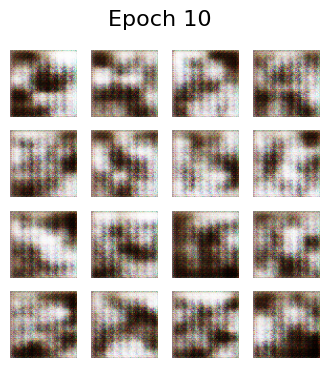

Epoch 20/400 completed | Generator Loss: 0.8899 | Discriminator Loss: 1.2106


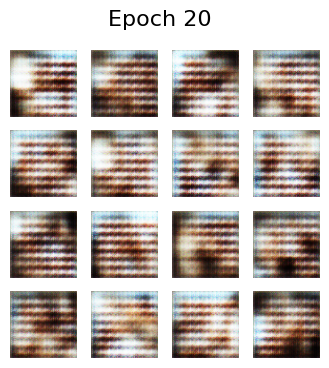

Epoch 30/400 completed | Generator Loss: 0.7572 | Discriminator Loss: 1.2964


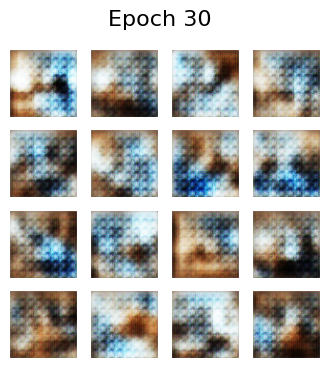

Epoch 40/400 completed | Generator Loss: 0.7565 | Discriminator Loss: 1.3533


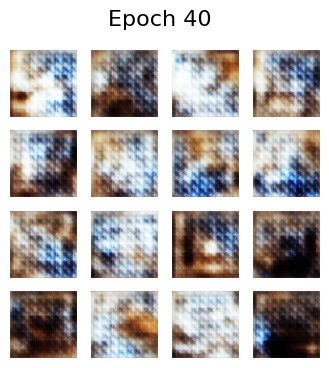

Epoch 50/400 completed | Generator Loss: 0.8388 | Discriminator Loss: 1.2478


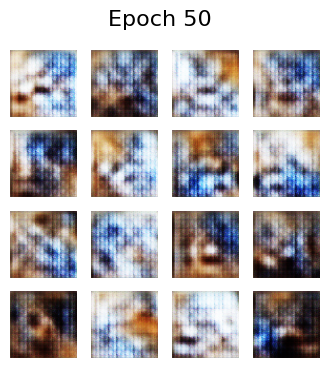

Epoch 60/400 completed | Generator Loss: 0.7628 | Discriminator Loss: 1.4131


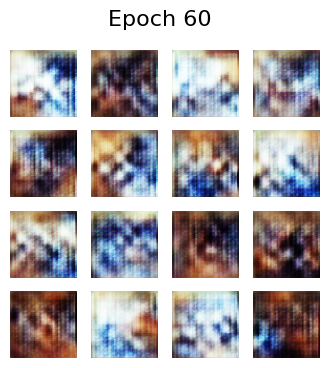

Epoch 70/400 completed | Generator Loss: 0.8463 | Discriminator Loss: 1.1950


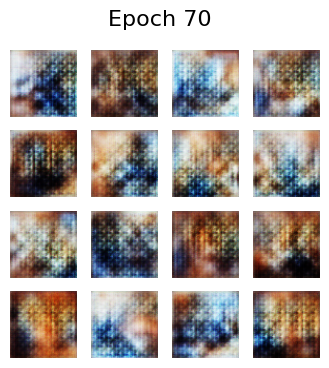

Epoch 80/400 completed | Generator Loss: 0.9698 | Discriminator Loss: 1.0606


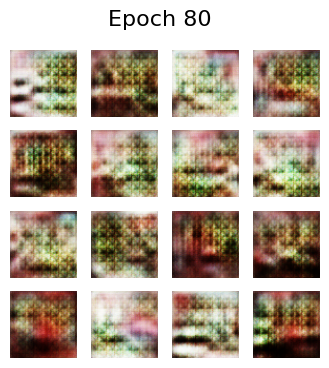

Epoch 90/400 completed | Generator Loss: 0.9966 | Discriminator Loss: 1.0272


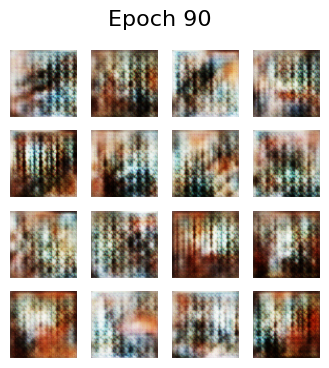

Epoch 100/400 completed | Generator Loss: 1.1143 | Discriminator Loss: 0.9489


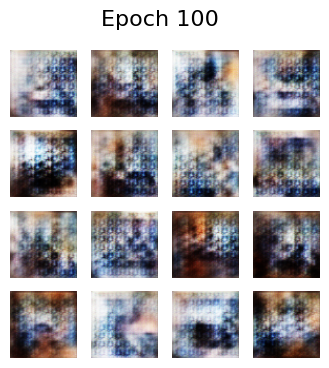

Epoch 110/400 completed | Generator Loss: 1.2312 | Discriminator Loss: 0.9419


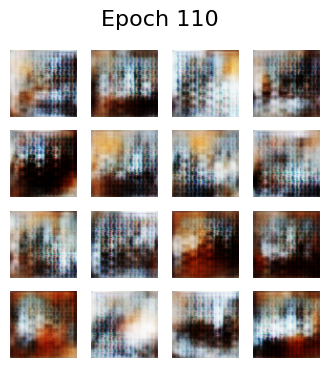

Epoch 120/400 completed | Generator Loss: 1.1958 | Discriminator Loss: 0.9617


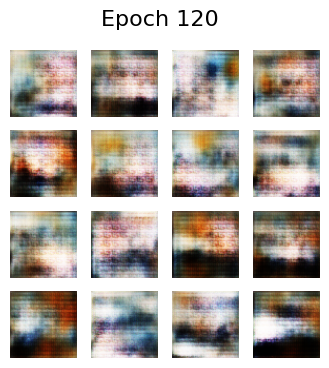

Epoch 130/400 completed | Generator Loss: 1.2271 | Discriminator Loss: 0.8338


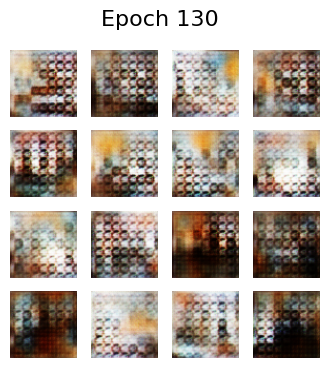

Epoch 140/400 completed | Generator Loss: 1.1067 | Discriminator Loss: 0.9809


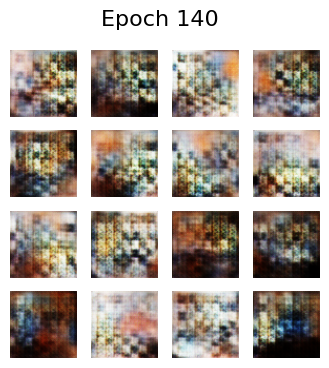

Epoch 150/400 completed | Generator Loss: 1.2943 | Discriminator Loss: 0.8233


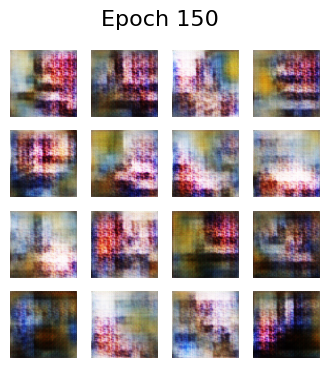

Epoch 160/400 completed | Generator Loss: 1.2617 | Discriminator Loss: 0.8591


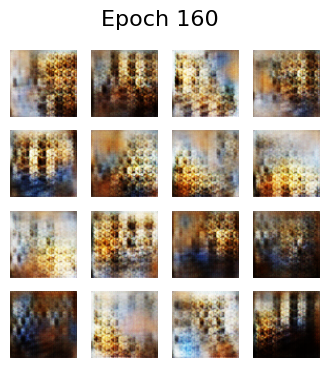

Epoch 170/400 completed | Generator Loss: 1.1623 | Discriminator Loss: 0.9598


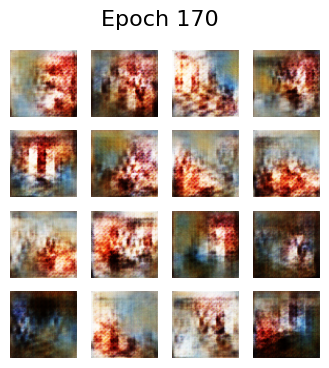

Epoch 180/400 completed | Generator Loss: 1.3254 | Discriminator Loss: 0.8441


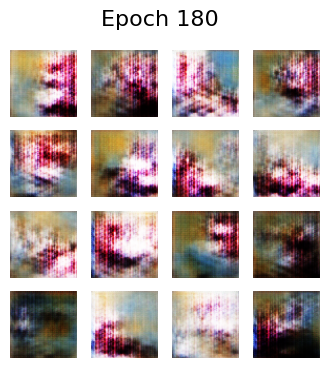

Epoch 190/400 completed | Generator Loss: 1.3102 | Discriminator Loss: 0.9444


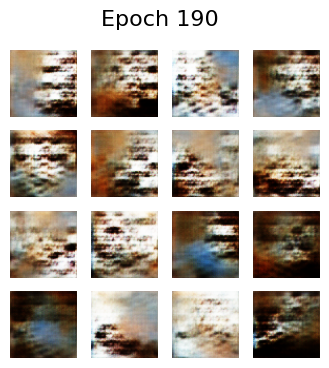

Epoch 200/400 completed | Generator Loss: 1.4305 | Discriminator Loss: 0.8021


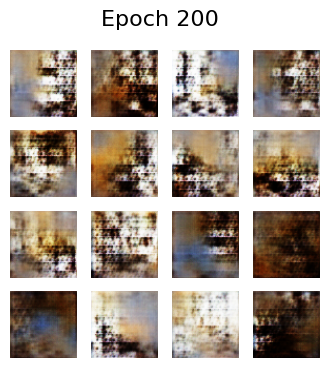

Epoch 210/400 completed | Generator Loss: 1.6588 | Discriminator Loss: 0.6697


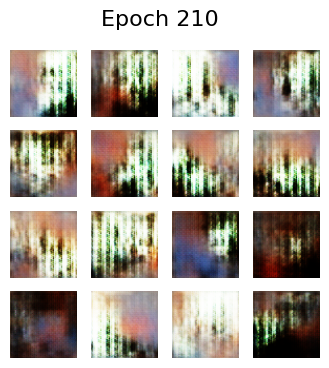

Epoch 220/400 completed | Generator Loss: 1.5601 | Discriminator Loss: 0.7569


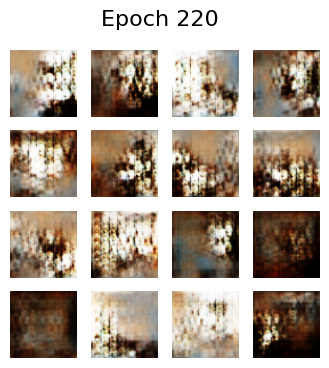

Epoch 230/400 completed | Generator Loss: 1.5041 | Discriminator Loss: 0.7497


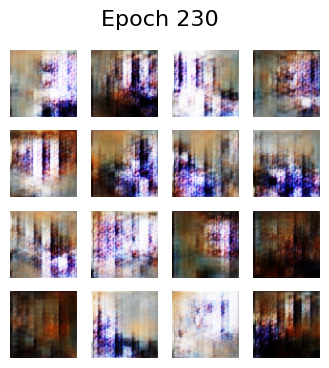

Epoch 240/400 completed | Generator Loss: 1.7980 | Discriminator Loss: 0.6706


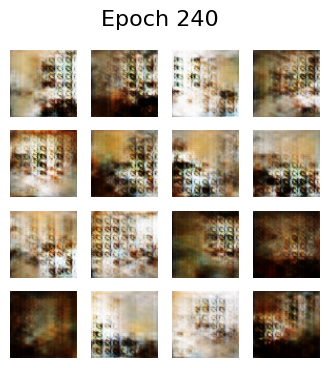

Epoch 250/400 completed | Generator Loss: 1.6500 | Discriminator Loss: 0.7396


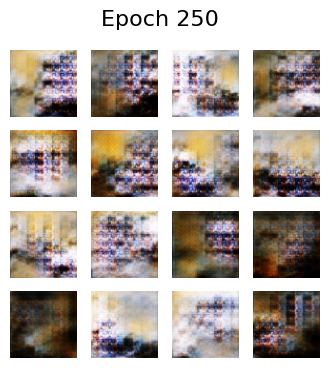

Epoch 260/400 completed | Generator Loss: 1.5633 | Discriminator Loss: 0.8649


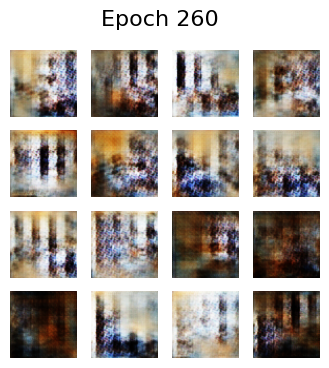

Epoch 270/400 completed | Generator Loss: 1.4950 | Discriminator Loss: 0.8542


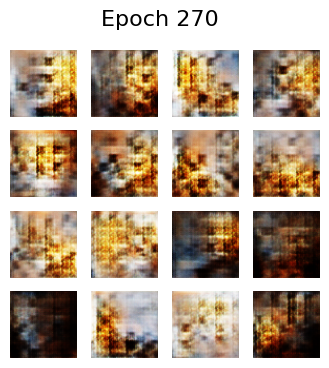

Epoch 280/400 completed | Generator Loss: 1.6867 | Discriminator Loss: 0.7843


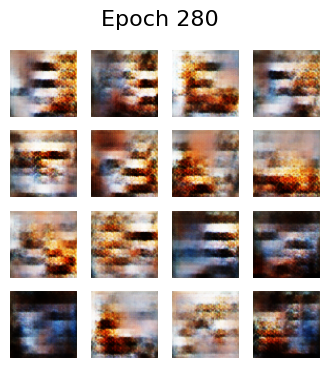

Epoch 290/400 completed | Generator Loss: 1.7381 | Discriminator Loss: 0.7093


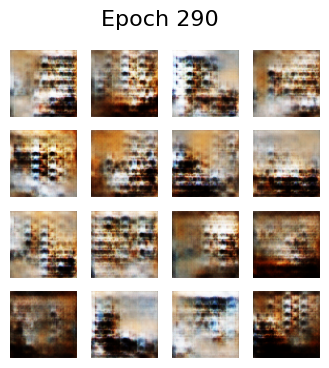

Epoch 300/400 completed | Generator Loss: 2.1235 | Discriminator Loss: 0.4577


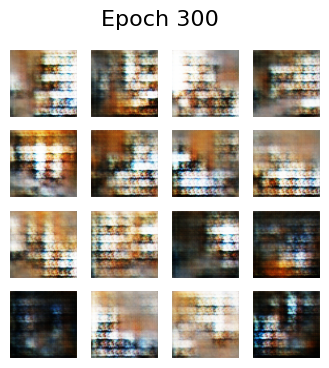

Epoch 310/400 completed | Generator Loss: 1.6667 | Discriminator Loss: 0.8942


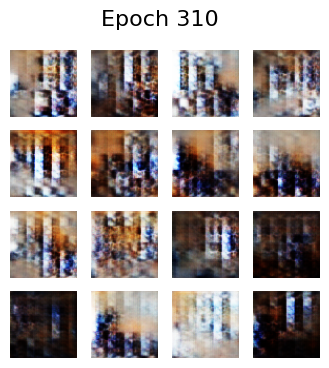

Epoch 320/400 completed | Generator Loss: 2.1907 | Discriminator Loss: 0.4892


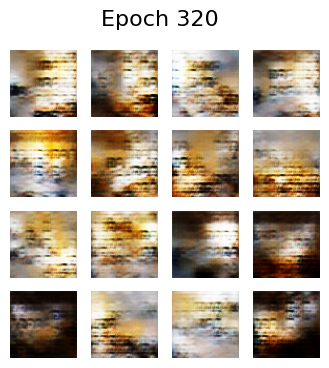

Epoch 330/400 completed | Generator Loss: 1.8080 | Discriminator Loss: 0.6156


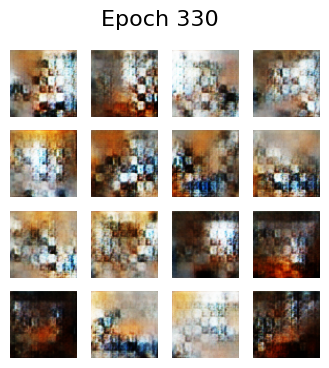

Epoch 340/400 completed | Generator Loss: 1.7723 | Discriminator Loss: 0.8134


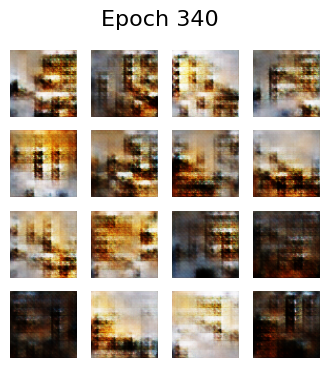

Epoch 350/400 completed | Generator Loss: 1.8012 | Discriminator Loss: 0.6728


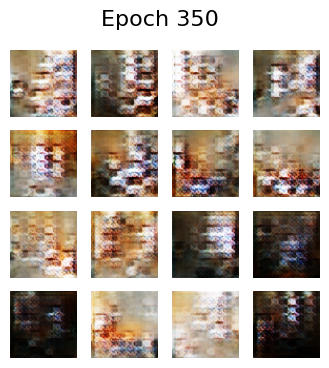

Epoch 360/400 completed | Generator Loss: 1.7179 | Discriminator Loss: 0.7521


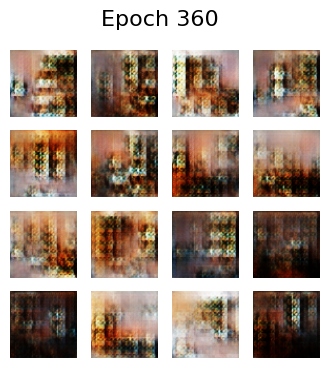

Epoch 370/400 completed | Generator Loss: 2.0656 | Discriminator Loss: 0.5274


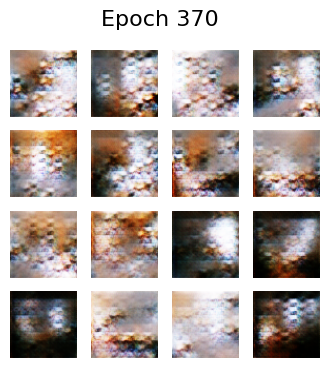

Epoch 380/400 completed | Generator Loss: 1.5822 | Discriminator Loss: 0.8514


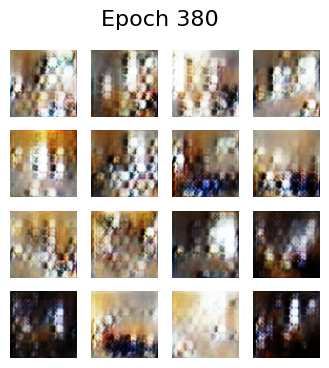

Epoch 390/400 completed | Generator Loss: 1.5031 | Discriminator Loss: 1.0293


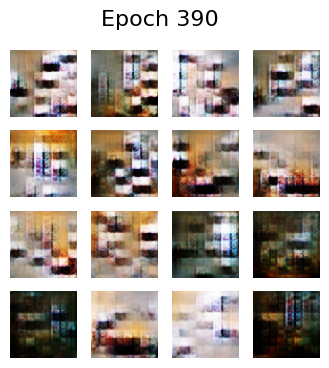

In [ ]:

#Start Training
train(train_dataset, EPOCHS)

# Generate some sample images after training
seed = tf.random.normal([16, NOISE_DIM])
generate_and_save_images(generator, EPOCHS, seed)


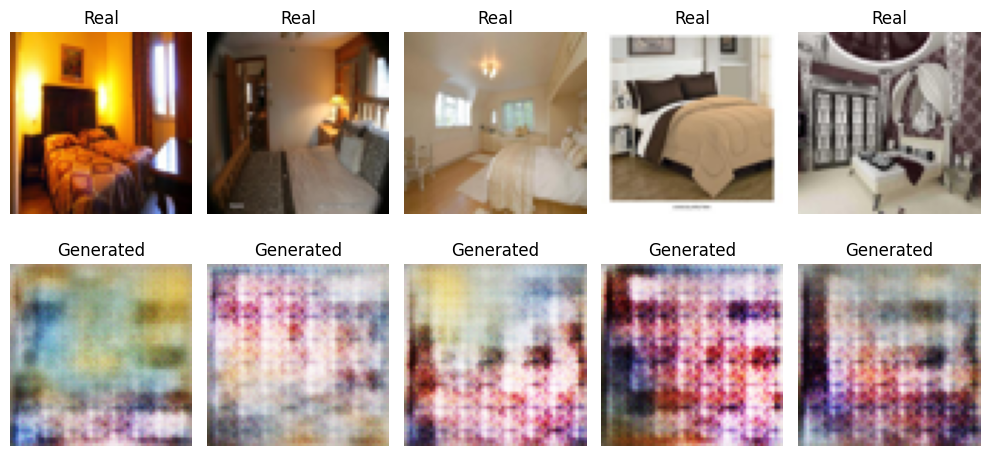

In [ ]:
# Display geenrated versus real images
seed = tf.random.normal([16, NOISE_DIM])

generated_images = generator(seed, training=False)

def display_comparison(real_images, generated_images, num_images=5):
    # Randomly select indices for real and generated images
    real_indices = np.random.choice(len(real_images), num_images, replace=False)
    generated_indices = np.random.choice(len(generated_images), num_images, replace=False)

    # Create a figure to display the images
    plt.figure(figsize=(10, 5))

    for i in range(num_images):
        # Display real images
        plt.subplot(2, num_images, i + 1)
        plt.imshow((real_images[real_indices[i]] * 127.5 + 127.5).clip(0, 255).astype(np.uint8))
        plt.axis('off')
        plt.title("Real")

        # Display generated images
        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow((generated_images[generated_indices[i]] * 127.5 + 127.5).clip(0, 255).astype(np.uint8))
        plt.axis('off')
        plt.title("Generated")

    plt.tight_layout()
    plt.show()

# Call the function after generating images
display_comparison(train_images, generated_images.numpy())
